

<Body>   
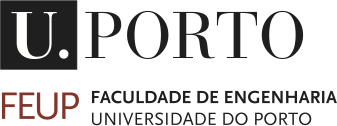   
<h1> <b>VCOMP - Assignment 2  - 2024/2025 </b> </h1>

</Body>  

###António Lopes - up202006725
###Joana Silva - up202006241

Faz no terminal uma vez na primeira vez que correres

pip install torch

pip install torch_snippets

pip install torchvision

pip install scikit-learn

pip install torchsummary

In [2]:
#Import the relevant packages:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.utils.data as data
import torchsummary as summary
from torch_snippets import *
import torchvision
import torchvision.transforms as transforms
from sklearn.model_selection import train_test_split
import cv2
import os
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import zipfile
import shutil
from tqdm import tqdm

In [3]:
# Define your execution device
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print("The model will be running on", device, "device")

The model will be running on cuda:0 device


### Download só no colab aqui ja tem o data set na pasta

### UNZIP

In [41]:
# Get the current working directory
folder_path = os.getcwd()

# Create a directory to store extracted files
output_folder = os.path.join(folder_path, "dataset")
os.makedirs(output_folder, exist_ok=True)

# Iterate over all files in the folder
for filename in os.listdir(folder_path):
    # Check if the file is a .zip file
    if filename.endswith('.zip'):
        zip_path = os.path.join(folder_path, filename)
        print(f"Processing: {filename}")
        
        # Open and extract the zip file
        with zipfile.ZipFile(zip_path, 'r') as zip_ref:
            # Extract directly into the output folder
            zip_ref.extractall(output_folder)
            print(f"Extracted {filename} into {output_folder}")

print(f"All .zip files in {folder_path} have been processed.")

All .zip files in c:\Users\Utilizador\Documents\GitHub\assign2 have been processed.


### Correct the Dataset

In [42]:
folder_path = os.getcwd()
folder_path = folder_path + "/dataset/Kame_CRAS_Pool_2023-09-18" 

# Remove the folder '2023_11_08'
folder_to_remove = os.path.join(folder_path, "2023_11_08")
if os.path.exists(folder_to_remove) and os.path.isdir(folder_to_remove):
    shutil.rmtree(folder_to_remove)
    print(f"Removed folder: {folder_to_remove}")
else:
    print(f"Folder {folder_to_remove} does not exist.")

# Extract contents of '2023_09_18' out of its folder
folder_to_extract = os.path.join(folder_path, "2023_09_18")
if os.path.exists(folder_to_extract) and os.path.isdir(folder_to_extract):
    for item in os.listdir(folder_to_extract):
        item_path = os.path.join(folder_to_extract, item)
        target_path = os.path.join(folder_path, item)
        
        # Move files and folders to the main directory
        shutil.move(item_path, target_path)
        print(f"Moved: {item_path} to {target_path}")
    
    # Remove the now-empty folder
    os.rmdir(folder_to_extract)
    print(f"Removed empty folder: {folder_to_extract}")
else:
    print(f"Folder {folder_to_extract} does not exist.")


Folder c:\Users\Utilizador\Documents\GitHub\assign2/dataset/Kame_CRAS_Pool_2023-11-08\2023_11_08 does not exist.
Folder c:\Users\Utilizador\Documents\GitHub\assign2/dataset/Kame_CRAS_Pool_2023-11-08\2023_09_18 does not exist.


### Create different datasets:

-Pool

-Ocean (Kame/Fifish/Both)

-All

In [ ]:
# Paths to the source folders and destination folders
pool_folders = [
    'dataset/Kame_CRAS_Pool_2023-09-18',
    'dataset/Kame_CRAS_Pool_2023-11-08'
]
output_images_folder = 'dataset/pool/images'
output_labels_folder = 'dataset/pool/labels'

# Create output directories if they don't exist
os.makedirs(output_images_folder, exist_ok=True)
os.makedirs(output_labels_folder, exist_ok=True)

# Initialize counters for images and labels
image_counter = 0
label_counter = 0

# Function to apply CLAHE to an image
def apply_clahe(image_path, output_path):
    # Read the image in color
    image = cv2.imread(image_path)
    # Split the image into its B, G, R channels
    b, g, r = cv2.split(image)
    # Apply CLAHE to the B and G channels
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    b_clahe = clahe.apply(b)
    g_clahe = clahe.apply(g)
    # Merge the CLAHE enhanced B and G channels back with the original R channel
    final_image = cv2.merge((b_clahe, g_clahe, r))
    # Save the processed image
    cv2.imwrite(output_path, final_image)

# Process each pool folder
for folder in pool_folders:
    images_folder = os.path.join(folder, 'images')
    labels_folder = os.path.join(folder, 'labels')
    
    # Process images
    for image_file in sorted(os.listdir(images_folder)):
        source_image = os.path.join(images_folder, image_file)
        target_image = os.path.join(output_images_folder, f"{image_counter}.png")  # Adjust extension if not .jpg
        apply_clahe(source_image, target_image)
        image_counter += 1
    
    # Process labels
    for label_file in sorted(os.listdir(labels_folder)):
        source_label = os.path.join(labels_folder, label_file)
        target_label = os.path.join(output_labels_folder, f"{label_counter}.txt")  # Adjust extension if not .txt
        shutil.copy(source_label, target_label)
        label_counter += 1

# Delete the original Kame_CRAS_Pool folders
for folder in pool_folders:
    shutil.rmtree(folder)  # Deletes the folder and all its contents

print(f"Pool dataset combined successfully into {output_images_folder} and {output_labels_folder}.")

FileNotFoundError: [WinError 3] O sistema não conseguiu localizar o caminho especificado: 'dataset/Kame_CRAS_Pool_2023-09-18\\images'

In [ ]:
# Paths to the source folders and destination folders
fifish_folders = [
    'dataset/Fifish_Durius_2023-09-27_(1)',
    'dataset/Fifish_Durius_2023-09-27_(2)',
    'dataset/Fifish_Durius_2023-09-27_(3)'
]
output_images_folder = 'dataset/fifish/images'
output_labels_folder = 'dataset/fifish/labels'

# Create output directories if they don't exist
os.makedirs(output_images_folder, exist_ok=True)
os.makedirs(output_labels_folder, exist_ok=True)

# Process each Fifish folder
for folder in fifish_folders:
    images_folder = os.path.join(folder, 'images')
    labels_folder = os.path.join(folder, 'labels')
    
    # Copy images
    for image_file in sorted(os.listdir(images_folder)):
        source_image = os.path.join(images_folder, image_file)
        target_image = os.path.join(output_images_folder, image_file)  # Keep the same name
        apply_clahe(source_image, target_image)
    
    # Copy labels
    for label_file in sorted(os.listdir(labels_folder)):
        source_label = os.path.join(labels_folder, label_file)
        target_label = os.path.join(output_labels_folder, label_file)  # Keep the same name
        shutil.copy(source_label, target_label)

# Delete the original Fifish folders
for folder in fifish_folders:
    shutil.rmtree(folder)  # Deletes the folder and all its contents

print(f"Fifish dataset combined successfully into {output_images_folder} and {output_labels_folder}.")


FileNotFoundError: [WinError 3] O sistema não conseguiu localizar o caminho especificado: 'dataset/Fifish_Durius_2023-09-27_(1)\\images'

In [7]:
import os
import shutil

# Paths to the source folders and destination folders
kame_folders = [
    'dataset/KAME_Durius_2023_07_05',
    'dataset/KAME_Durius_2023_07_06',
    'dataset/KAME_Durius_2023_09_26',
    'dataset/KAME_Durius_2023_10_12',
    'dataset/KAME_Durius_2023_10_13'
]
output_images_folder = 'dataset/kame/images'
output_labels_folder = 'dataset/kame/labels'

# Create output directories if they don't exist
os.makedirs(output_images_folder, exist_ok=True)
os.makedirs(output_labels_folder, exist_ok=True)

# Initialize counters for images and labels
image_counter = 0
label_counter = 0

# Process each Kame folder
for folder in kame_folders:
    images_folder = os.path.join(folder, 'images')
    labels_folder = os.path.join(folder, 'labels')
    
    # Process images
    for image_file in sorted(os.listdir(images_folder)):
        source_image = os.path.join(images_folder, image_file)
        target_image = os.path.join(output_images_folder, f"{image_counter}.png")  # Adjust extension if not .jpg
        apply_clahe(source_image, target_image)
        image_counter += 1
    
    # Process labels
    for label_file in sorted(os.listdir(labels_folder)):
        source_label = os.path.join(labels_folder, label_file)
        target_label = os.path.join(output_labels_folder, f"{label_counter}.txt")  # Adjust extension if not .txt
        shutil.copy(source_label, target_label)
        label_counter += 1

# Delete the original Kame folders
for folder in kame_folders:
    shutil.rmtree(folder)  # Deletes the folder and all its contents

print(f"Kame dataset combined successfully into {output_images_folder} and {output_labels_folder}.")


Kame dataset combined successfully into dataset/kame/images and dataset/kame/labels.


In [ ]:
import os
import shutil

# Paths to the existing datasets
kame_images_folder = 'dataset/kame/images'
kame_labels_folder = 'dataset/kame/labels'
fifish_images_folder = 'dataset/fifish/images'
fifish_labels_folder = 'dataset/fifish/labels'

# Paths to the combined output dataset
output_images_folder = 'dataset/ocean/images'
output_labels_folder = 'dataset/ocean/labels'

# Create output directories if they don't exist
os.makedirs(output_images_folder, exist_ok=True)
os.makedirs(output_labels_folder, exist_ok=True)

# Initialize counters for images and labels
image_counter = 0
label_counter = 0

# Process Kame dataset
for image_file in sorted(os.listdir(kame_images_folder)):
    source_image = os.path.join(kame_images_folder, image_file)
    target_image = os.path.join(output_images_folder, f"{image_counter}.png")  # Adjust extension if not .jpg
    shutil.copy(source_image, target_image)
    image_counter += 1

for label_file in sorted(os.listdir(kame_labels_folder)):
    source_label = os.path.join(kame_labels_folder, label_file)
    target_label = os.path.join(output_labels_folder, f"{label_counter}.txt")  # Adjust extension if not .txt
    shutil.copy(source_label, target_label)
    label_counter += 1

# Process Fifish dataset
for image_file in sorted(os.listdir(fifish_images_folder)):
    source_image = os.path.join(fifish_images_folder, image_file)
    target_image = os.path.join(output_images_folder, f"{image_counter}.png")  # Continue numbering
    shutil.copy(source_image, target_image)
    image_counter += 1

for label_file in sorted(os.listdir(fifish_labels_folder)):
    source_label = os.path.join(fifish_labels_folder, label_file)
    target_label = os.path.join(output_labels_folder, f"{label_counter}.txt")  # Continue numbering
    shutil.copy(source_label, target_label)
    label_counter += 1

print(f"Combined dataset successfully created in {output_images_folder} and {output_labels_folder}.")


FileNotFoundError: [WinError 3] O sistema não conseguiu localizar o caminho especificado: 'dataset/kame/images'

In [9]:
import os
import shutil

# Paths to the existing datasets
pool_images_folder = 'dataset/pool/images'
pool_labels_folder = 'dataset/pool/labels'
ocean_images_folder = 'dataset/ocean/images'
ocean_labels_folder = 'dataset/ocean/labels'

# Paths to the combined output dataset
output_images_folder = 'dataset/combined/images'
output_labels_folder = 'dataset/combined/labels'

# Create output directories if they don't exist
os.makedirs(output_images_folder, exist_ok=True)
os.makedirs(output_labels_folder, exist_ok=True)

# Initialize counters for images and labels
image_counter = 0
label_counter = 0

# Process Pool dataset
for image_file in sorted(os.listdir(pool_images_folder)):
    source_image = os.path.join(pool_images_folder, image_file)
    target_image = os.path.join(output_images_folder, f"{image_counter}.png")  # Adjust extension if not .jpg
    shutil.copy(source_image, target_image)
    image_counter += 1

for label_file in sorted(os.listdir(pool_labels_folder)):
    source_label = os.path.join(pool_labels_folder, label_file)
    target_label = os.path.join(output_labels_folder, f"{label_counter}.txt")  # Adjust extension if not .txt
    shutil.copy(source_label, target_label)
    label_counter += 1

# Process Ocean dataset
for image_file in sorted(os.listdir(ocean_images_folder)):
    source_image = os.path.join(ocean_images_folder, image_file)
    target_image = os.path.join(output_images_folder, f"{image_counter}.png")  # Continue numbering
    shutil.copy(source_image, target_image)
    image_counter += 1

for label_file in sorted(os.listdir(ocean_labels_folder)):
    source_label = os.path.join(ocean_labels_folder, label_file)
    target_label = os.path.join(output_labels_folder, f"{label_counter}.txt")  # Continue numbering
    shutil.copy(source_label, target_label)
    label_counter += 1

print(f"Combined dataset successfully created in {output_images_folder} and {output_labels_folder}.")

Combined dataset successfully created in dataset/combined/images and dataset/combined/labels.


### Split Dataset

In [10]:
import os
import random
import shutil

def split_dataset(image_dir, labels_dir, train_dir, val_dir, test_dir, train_ratio=0.8, val_ratio=0.1):

    # Get all image files 
    image_files = [f for f in os.listdir(image_dir) if f.endswith('.png')]

    # Create pairs of image files and corresponding annotation files
    image_labels_pairs = []
    for image_file in image_files:
        labels_file = image_file.replace('.png', '.txt')
        if os.path.exists(os.path.join(labels_dir, labels_file)):
            image_labels_pairs.append((image_file, labels_file))
    
    # Shuffle the image-annotation pairs
    random.shuffle(image_labels_pairs)
    
    # Calculate split indices
    total_count = len(image_labels_pairs)
    train_split_idx = int(total_count * train_ratio)
    val_split_idx = train_split_idx + int(total_count * val_ratio)
    
    # Split the pairs into training, validation, and testing sets
    train_pairs = image_labels_pairs[:train_split_idx]
    val_pairs = image_labels_pairs[train_split_idx:val_split_idx]
    test_pairs = image_labels_pairs[val_split_idx:]

    # Create directories for training, validation, and testing if they don't exist
    os.makedirs(train_dir, exist_ok=True)
    os.makedirs(val_dir, exist_ok=True)
    os.makedirs(test_dir, exist_ok=True)
    os.makedirs(os.path.join(train_dir, 'images'), exist_ok=True)
    os.makedirs(os.path.join(val_dir, 'images'), exist_ok=True)
    os.makedirs(os.path.join(test_dir, 'images'), exist_ok=True)
    os.makedirs(os.path.join(train_dir, 'labels'), exist_ok=True)
    os.makedirs(os.path.join(val_dir, 'labels'), exist_ok=True)
    os.makedirs(os.path.join(test_dir, 'labels'), exist_ok=True)

    # Move training pairs to train directory
    for image_file, annotation_file in train_pairs:
        shutil.move(os.path.join(image_dir, image_file), os.path.join(train_dir, 'images', image_file))
        shutil.move(os.path.join(labels_dir, annotation_file), os.path.join(train_dir, 'labels', annotation_file))

    # Move validation pairs to val directory
    for image_file, annotation_file in val_pairs:
        shutil.move(os.path.join(image_dir, image_file), os.path.join(val_dir, 'images', image_file))
        shutil.move(os.path.join(labels_dir, annotation_file), os.path.join(val_dir, 'labels', annotation_file))

    # Move testing pairs to test directory
    for image_file, annotation_file in test_pairs:
        shutil.move(os.path.join(image_dir, image_file), os.path.join(test_dir, 'images', image_file))
        shutil.move(os.path.join(labels_dir, annotation_file), os.path.join(test_dir, 'labels', annotation_file))

    print(f"Dataset split complete: {len(train_pairs)} train images, {len(val_pairs)} validation images, {len(test_pairs)} test images.")

In [11]:
split_dataset('dataset/pool/images', 'dataset/pool/labels', 'dataset/pool/train', 'dataset/pool/val', 'dataset/pool/test')
split_dataset('dataset/kame/images', 'dataset/kame/labels', 'dataset/kame/train', 'dataset/kame/val', 'dataset/kame/test')
split_dataset('dataset/fifish/images', 'dataset/fifish/labels', 'dataset/fifish/train', 'dataset/fifish/val', 'dataset/fifish/test')
split_dataset('dataset/ocean/images', 'dataset/ocean/labels', 'dataset/ocean/train', 'dataset/ocean/val', 'dataset/ocean/test')
split_dataset('dataset/combined/images', 'dataset/combined/labels', 'dataset/combined/train', 'dataset/combined/val', 'dataset/combined/test')

Dataset split complete: 3044 train images, 380 validation images, 382 test images.
Dataset split complete: 6357 train images, 794 validation images, 796 test images.
Dataset split complete: 5181 train images, 647 validation images, 649 test images.
Dataset split complete: 11539 train images, 1442 validation images, 1443 test images.
Dataset split complete: 14584 train images, 1823 validation images, 1823 test images.


### Show sample images detection of anodes

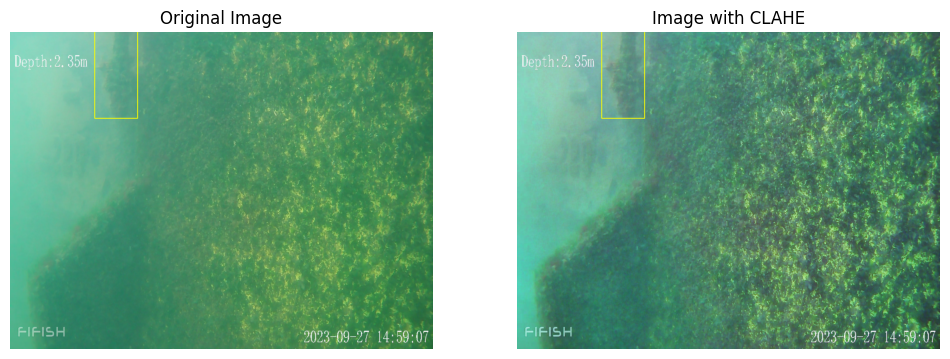

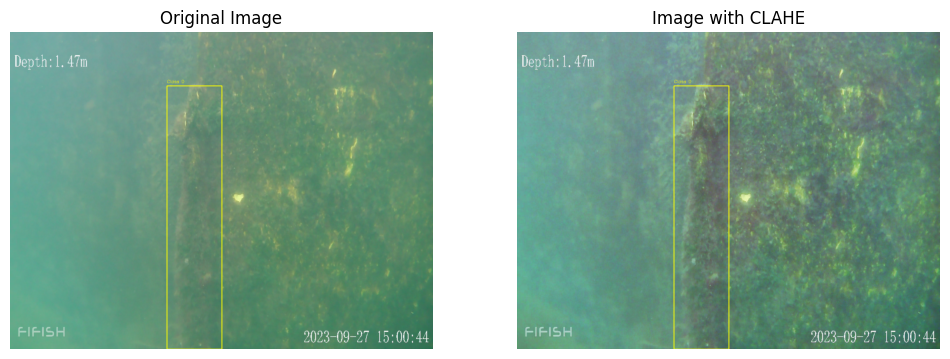

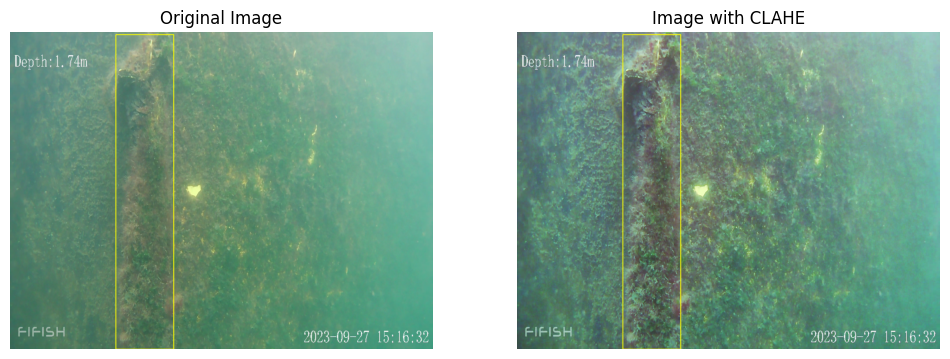

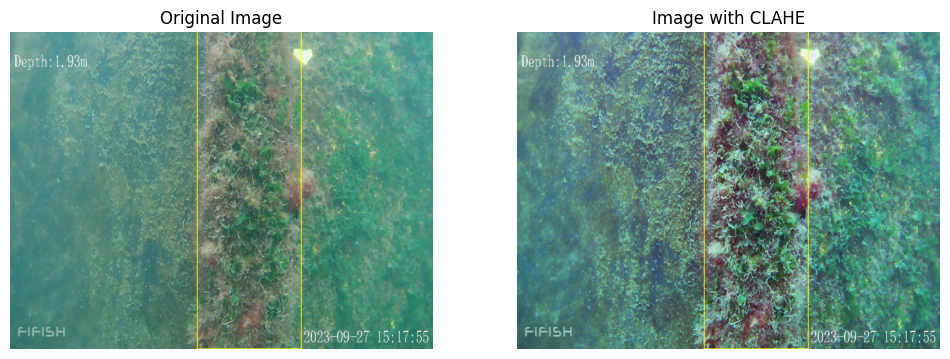

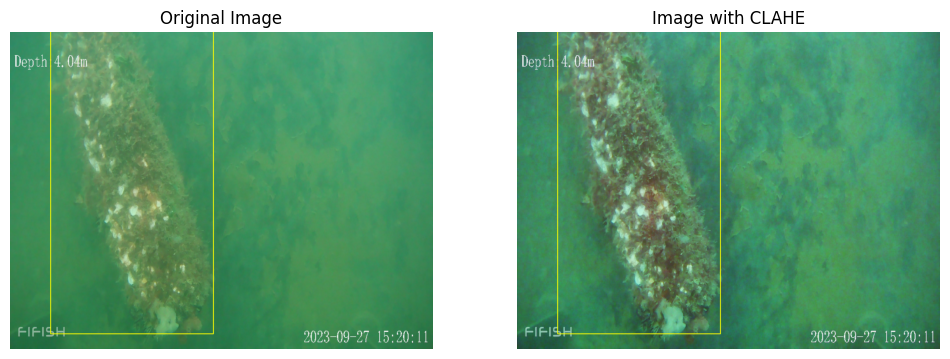

...

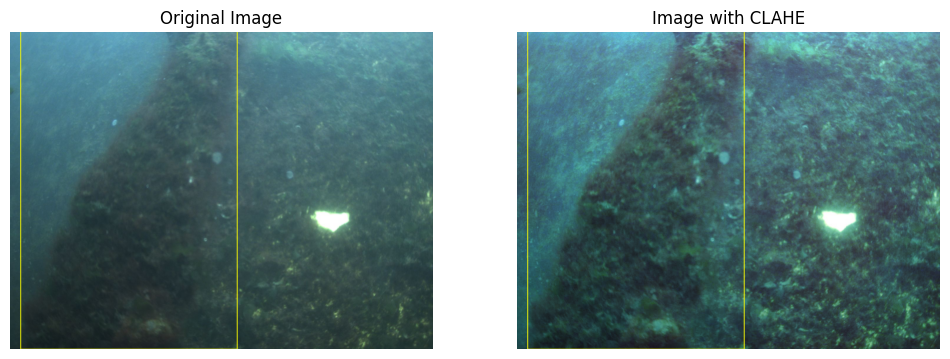

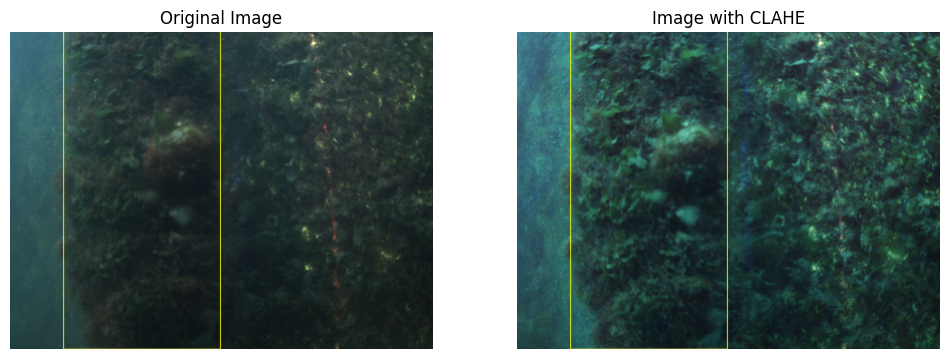

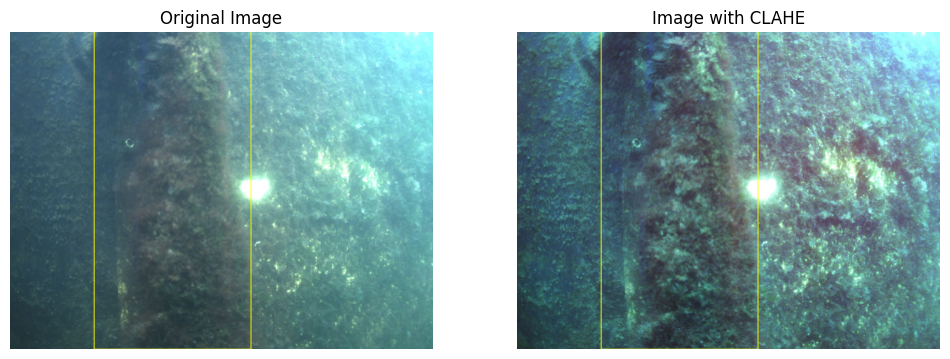

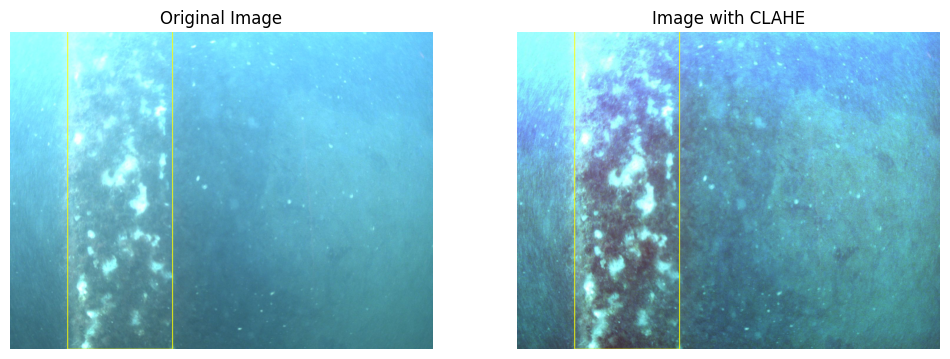

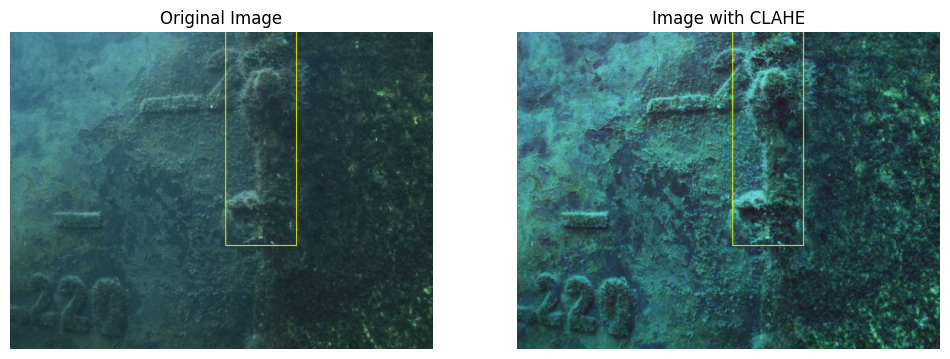

In [3]:
import os
import cv2
import matplotlib.pyplot as plt

# Get the current working directory
folder_path = os.getcwd()

# Path to the Sample folder
sample_folder = os.path.join(folder_path, "dataset/Sample")

# Define the paths for images and labels
image_folder = os.path.join(sample_folder, "images")  # Adjust folder name if different
label_folder = os.path.join(sample_folder, "labels")  # Adjust folder name if different

# Helper function to sort files numerically
def numerical_sort(file_list):
    return sorted(file_list, key=lambda x: int(x.split('_')[-1].split('.')[0]))

# Get sorted lists of image and label files
image_files = numerical_sort([f for f in os.listdir(image_folder) if f.startswith("sample_") and f.endswith(".png")])
label_files = numerical_sort([f for f in os.listdir(label_folder) if f.startswith("sample_") and f.endswith(".txt")])

def xywh_to_xyxy(x, y, w, h):
    # Convert normalized values to pixel values
    x_center, y_center, width, height = x, y, w, h
    img_h, img_w, _ = image.shape
    x_center *= img_w
    y_center *= img_h
    width *= img_w
    height *= img_h

    # Calculate bounding box coordinates
    x_min = int(x_center - width / 2)
    y_min = int(y_center - height / 2)
    x_max = int(x_center + width / 2)
    y_max = int(y_center + height / 2)

    return x_min, y_min, x_max, y_max               

# Iterate through sorted image and label files
for image_file, label_file in zip(image_files, label_files):
    image_path = os.path.join(image_folder, image_file)
    label_path = os.path.join(label_folder, label_file)
    
    # Read the image
    image = cv2.imread(image_path)
    if image is None:
        print(f"Image not found: {image_path}")
        continue

    # Read the corresponding label file
    with open(label_path, "r") as file:
        for line in file.readlines():
            values = line.split()
            class_id = int(values[0])  # Classification ID

            x_center, y_center, width, height = map(float, values[1:])
            x_min, y_min, x_max, y_max = xywh_to_xyxy(x_center, y_center, width, height)

            # Draw the bounding box
            cv2.rectangle(image, (x_min, y_min), (x_max, y_max), (0, 255, 255), 2)  # Bounding box in cyan color
            # Add class label
            cv2.putText(image, f"Class {class_id}", (x_min, y_min - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 255), 1)

    # Convert the image from BGR to RGB for displaying with matplotlib

    b, g, r = cv2.split(image)
    # Apply CLAHE to the B and G channels
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    b_clahe = clahe.apply(b)
    g_clahe = clahe.apply(g)
    # Merge the CLAHE enhanced B and G channels back with the original R channel
    final_image = cv2.merge((b_clahe, g_clahe, r))

    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    final_image_rgb = cv2.cvtColor(final_image, cv2.COLOR_BGR2RGB)

    
    # Display the images begore and after applying CLAHE
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.imshow(image_rgb)
    plt.title("Original Image")
    plt.axis('off')
    plt.subplot(1, 2, 2)
    plt.imshow(final_image_rgb)
    plt.title("Image with CLAHE")
    plt.axis('off')
    plt.show()

### Data Augmentation

In [13]:
from torch.utils.data import DataLoader

def get_transforms_with_augmentation():
    return transforms.Compose([
        transforms.RandomHorizontalFlip(),
        transforms.RandomRotation(10),
        transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.2),
        transforms.GaussianBlur(kernel_size=3),
        transforms.ToTensor()
    ])

### Create the dataset Class

In [4]:
class Dataset(data.Dataset):
    def __init__(self, image_dir, label_dir, img_height, img_width):
        self.image_dir = image_dir
        self.label_dir = label_dir
        self.img_height = img_height
        self.img_width = img_width

        # Match images and annotations by filenames
        self.image_files = sorted([f for f in os.listdir(image_dir) if f.endswith((".png"))])
        self.label_files = sorted([f for f in os.listdir(label_dir) if f.endswith(".txt")])
        assert len(self.image_files) == len(self.label_files), "Mismatch in images and annotations count."

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        img_path = os.path.join(self.image_dir, self.image_files[idx])
        img = cv2.imread(img_path)
        img = cv2.resize(img, (self.img_width, self.img_height))
        img = img / 255.0  # Normalize to [0, 1]
        img = torch.tensor(img, dtype=torch.float32).permute(2, 0, 1)

        # Load annotation
        label_path = os.path.join(self.label_dir, self.label_files[idx])
        if os.path.exists(label_path) and os.path.getsize(label_path) > 0:
            with open(label_path, "r") as f:
                line = f.readline().strip()
            if line:  # File is not empty and has valid content
                _, x_center, y_center, width, height = map(float, line.split())
                target = torch.tensor([x_center, y_center, width, height], dtype=torch.float32)
            else:
                print(f"Empty annotation file: {label_path}")
                target = torch.tensor([0, 0, 0, 0], dtype=torch.float32)
        else:
            target = torch.tensor([0, 0, 0, 0], dtype=torch.float32)

        return img, target

### Create Custom Model

In [5]:
class A(nn.Module):
    def __init__(self, img_height, img_width):
        super(A, self).__init__()
        # Convolutional layers
        self.conv1 = nn.Conv2d(3, 16, kernel_size=3, stride=1, padding=1)
        self.conv11 = nn.Conv2d(16, 16, kernel_size=3, stride=1, padding=1)
        self.pool = nn.MaxPool2d(2, 2)  # Pooling layer
        self.conv2 = nn.Conv2d(16, 32, kernel_size=3, stride=1, padding=1)
        self.conv22 = nn.Conv2d(32, 32, kernel_size=3, stride=1, padding=1)
        self.conv3 = nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1)
        self.conv33 = nn.Conv2d(64, 64, kernel_size=3, stride=1, padding=1)


        self.dropout = nn.Dropout(0.1)  # Dropout layer
        
        # Fully connected layers
        feature_size = 64 * (img_height // 8) * (img_width // 8)  # 8x downsampled
        self.fc1 = nn.Linear(feature_size, 1024)
        self.fc2 = nn.Linear(1024, 512)
        self.fc3 = nn.Linear(512, 256)
        self.fc3_bbox = nn.Linear(256, 4)  # Bounding box prediction output (x, y, w, h)

    def forward(self, x):
        # Forward through convolutional layers
        x = F.relu(self.conv1(x))
        x = F.relu(self.conv11(x))
        x = self.pool(x)
        x = F.relu(self.conv2(x))
        x = F.relu(self.conv22(x))
        x = self.pool(x)
        x = F.relu(self.conv3(x))
        x = F.relu(self.conv33(x))
        x = self.pool(x)
        
        # Flatten the feature maps
        x = torch.flatten(x, 1)  # Flatten all dimensions except batch
        
        # Forward through fully connected layers
        x = F.relu(self.fc1(x))
        x = self.dropout(x)
        x = F.relu(self.fc2(x))
        x = F.relu(self.fc3(x))
        
        # Separate outputs for class and bounding box predictions
        bbox_preds = self.fc3_bbox(x)    # Bounding box prediction (x, y, w, h)
        
        return bbox_preds

In [6]:
class A1(nn.Module):
    def __init__(self, img_height, img_width):
        super(A1, self).__init__()
# Convolutional layers with Batch Normalization and Group Normalization
        self.conv1 = nn.Conv2d(3, 16, kernel_size=3, stride=1, padding=1)
        self.conv1_bn = nn.BatchNorm2d(16, momentum=0.1)
        self.conv11 = nn.Conv2d(16, 16, kernel_size=3, stride=1, padding=1)
        self.conv11_bn = nn.BatchNorm2d(16, momentum=0.1)
        
        self.pool = nn.MaxPool2d(2, 2)

        self.conv2 = nn.Conv2d(16, 32, kernel_size=3, stride=1, padding=1)
        self.conv2_bn = nn.BatchNorm2d(32, momentum=0.1)
        self.conv22 = nn.Conv2d(32, 32, kernel_size=3, stride=1, padding=1)
        self.conv22_bn = nn.BatchNorm2d(32, momentum=0.1)

        self.conv3 = nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1)
        self.conv3_bn = nn.BatchNorm2d(64, momentum=0.1)
        self.conv33 = nn.Conv2d(64, 64, kernel_size=3, stride=1, padding=1)
        self.conv33_bn = nn.BatchNorm2d(64, momentum=0.1)

        # Dropout for regularization
        self.dropout1 = nn.Dropout(0.05)  # Light dropout for earlier layers
        self.dropout2 = nn.Dropout(0.1)  # Slightly stronger dropout for deeper layers
        
        # Fully connected layers
        feature_size = 64 * (img_height // 8) * (img_width // 8)
        self.fc1 = nn.Linear(feature_size, 1024)
        self.fc1_bn = nn.BatchNorm1d(1024)
        self.fc2 = nn.Linear(1024, 512)
        self.fc2_bn = nn.BatchNorm1d(512)
        self.fc3 = nn.Linear(512, 256)
        self.fc3_bbox = nn.Linear(256, 4)  # Bounding box prediction

        # Activation function
        self.activation = nn.LeakyReLU(negative_slope=0.01)

    def forward(self, x):
        # Forward through convolutional layers with Batch Norm and ReLU
        x = self.activation(self.conv1_bn(self.conv1(x)))
        x = self.activation(self.conv11_bn(self.conv11(x)))
        x = self.pool(x)

        x = self.activation(self.conv2_bn(self.conv2(x)))
        x = self.activation(self.conv22_bn(self.conv22(x)))
        x = self.pool(x)

        x = self.activation(self.conv3_bn(self.conv3(x)))
        x = self.activation(self.conv33_bn(self.conv33(x)))
        x = self.pool(x)

        # Flatten the feature maps
        x = torch.flatten(x, 1)

        # Fully connected layers with Dropout and Batch Normalization
        x = self.activation(self.fc1_bn(self.fc1(x)))
        x = self.dropout1(x)
        x = self.activation(self.fc2_bn(self.fc2(x)))
        x = self.dropout2(x)
        x = self.activation(self.fc3(x))

        # Bounding box predictions
        bbox_preds = self.fc3_bbox(x)  # (x, y, w, h)

        return bbox_preds

In [8]:
class A2(nn.Module):
    def __init__(self, img_height, img_width):
        super(A2, self).__init__()
        # Convolutional layers
        self.conv1 = nn.Conv2d(3, 16, kernel_size=3, stride=1, padding=1)
        self.conv11 = nn.Conv2d(16, 16, kernel_size=3, stride=1, padding=1)
        self.conv11_bn = nn.BatchNorm2d(16)  # Batch normalization
        self.pool = nn.MaxPool2d(2, 2)  # Pooling layer

        self.conv2 = nn.Conv2d(16, 32, kernel_size=3, stride=1, padding=1)
        self.conv22 = nn.Conv2d(32, 32, kernel_size=3, stride=1, padding=1)
        self.conv22_bn = nn.BatchNorm2d(32)  # Batch normalization

        self.conv3 = nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1)
        self.conv33 = nn.Conv2d(64, 64, kernel_size=3, stride=1, padding=1)
        self.conv33_bn = nn.BatchNorm2d(64)  # Batch normalization

        self.dropout = nn.Dropout(0.2)  # Dropout layer
        
        feature_size = 64 * (img_height // 8) * (img_width // 8)  # 8x downsampled
        self.fc1 = nn.Linear(feature_size, 1024)  # Reduced feature size after GAP
        self.fc2 = nn.Linear(1024, 512)
        self.fc3 = nn.Linear(512, 256)
        self.conv33 = nn.Conv2d(64, 64, kernel_size=3, stride=1, padding=1, dilation=1)
        self.conv33_bn = nn.BatchNorm2d(64)
        # Forward through convolutional layers
        x = F.relu(self.conv11_bn(self.conv1(x)))
        x = F.relu(self.conv11(x))
        x = self.pool(x)
        x = F.relu(self.conv22_bn(self.conv2(x)))
        x = F.relu(self.conv22(x))
        x = self.pool(x)
        x = F.relu(self.conv33_bn(self.conv3(x)))
        x = F.relu(self.conv33(x))
        x = self.pool(x)
        
        # Global Average Pooling
        x = torch.flatten(x, 1)  # Flatten to (batch_size, channels)

        # Forward through fully connected layers
        x = F.relu(self.fc1(x))
        x = self.dropout(x)  # Dropout for regularization
        x = F.relu(self.fc2(x))
        x = F.relu(self.fc3(x))
        
        # Bounding box predictions
        bbox_preds = self.fc3_bbox(x)  # Bounding box prediction (x, y, w, h)
        
        return bbox_preds

### Loss Function

In [9]:
# Loss Function
def loss_function(targets, predictions):
    target_boxes = targets[:, :4]
    pred_boxes = predictions[:, :4]

    bbox_loss = nn.MSELoss()(pred_boxes, target_boxes)
    
    return bbox_loss

### IOU

In [10]:
# Define IoU Calculation Function
def calculate_iou(pred_bbox, true_bbox):
    # Convert from (x_center, y_center, width, height) to (x1, y1, x2, y2)
    pred_x1 = pred_bbox[:, 0] - pred_bbox[:, 2] / 2
    pred_y1 = pred_bbox[:, 1] - pred_bbox[:, 3] / 2
    pred_x2 = pred_bbox[:, 0] + pred_bbox[:, 2] / 2
    pred_y2 = pred_bbox[:, 1] + pred_bbox[:, 3] / 2

    true_x1 = true_bbox[:, 0] - true_bbox[:, 2] / 2
    true_y1 = true_bbox[:, 1] - true_bbox[:, 3] / 2
    true_x2 = true_bbox[:, 0] + true_bbox[:, 2] / 2
    true_y2 = true_bbox[:, 1] + true_bbox[:, 3] / 2

    # Calculate intersection
    inter_x1 = torch.max(pred_x1, true_x1)
    inter_y1 = torch.max(pred_y1, true_y1)
    inter_x2 = torch.min(pred_x2, true_x2)
    inter_y2 = torch.min(pred_y2, true_y2)

    inter_area = torch.clamp(inter_x2 - inter_x1, min=0) * torch.clamp(inter_y2 - inter_y1, min=0)

    # Calculate union
    pred_area = (pred_x2 - pred_x1) * (pred_y2 - pred_y1)
    true_area = (true_x2 - true_x1) * (true_y2 - true_y1)

    union_area = pred_area + true_area - inter_area

    iou = torch.where(union_area > 0, inter_area / union_area, torch.zeros_like(union_area))
    
    return iou

### Train Custom Model (without Data Augmentation)

In [ ]:
import torch
import torch.nn as nn
from torch import optim
from torch.utils.data import DataLoader

#  Set Paths
train_image_dir = "dataset/pool/train/images"
train_label_dir = "dataset/pool/train/labels"
val_image_dir = "dataset/pool/val/images"
val_label_dir = "dataset/pool/val/labels"

# Model Parameters
img_height = 360 # Image size
img_width = 480
batch_size = 32
num_epochs = 10
learning_rate = 0.001

# Dataset and DataLoader
train_dataset = Dataset(image_dir=train_image_dir, label_dir=train_label_dir, img_height=img_height, img_width=img_width)
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

val_dataset = Dataset(image_dir=val_image_dir, label_dir=val_label_dir, img_height=img_height, img_width=img_width)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)

# Model
model = A1(img_height, img_width).to(device)  # Output for bbox (x, y, w, h)

# Loss and Optimizer
optimizer = optim.Adam(model.parameters(), lr=learning_rate)

best_iou = 0.0

# Training Loop with tqdm
for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    iou_sum = 0.0

    with tqdm(train_loader, unit="batch") as train_bar:
        train_bar.set_description(f"Epoch {epoch + 1}/{num_epochs}")
        for images, targets in train_bar:
            images = images.to(device)
            targets = targets.to(device)

            # Zero the gradients
            optimizer.zero_grad()

            # Forward pass
            bbox_preds = model(images)

            # Compute loss
            loss = loss_function(targets, bbox_preds)
            running_loss += loss.item()

            # Backward pass and update weights
            loss.backward()
            optimizer.step()

            # Calculate IoU
            iou = calculate_iou(bbox_preds, targets)
            iou_mean = iou.mean().item()
            iou_sum += iou_mean

            # Update progress bar
            train_bar.set_postfix(loss=loss.item(), iou=iou_mean)

    torch.cuda.empty_cache()

    avg_train_loss = running_loss / len(train_loader)
    avg_train_iou = iou_sum / len(train_loader)
    print(f"Epoch {epoch + 1}/{num_epochs}, Train Loss: {avg_train_loss:.4f}, IoU: {avg_train_iou:.4f}")

    #Best Epoch
    if avg_train_iou > best_iou:
        print("Best Epoch")
        best_iou = avg_train_iou
        best_epoch = epoch
        loss = avg_train_loss
        torch.save(model.state_dict(), "custom.pth")

    # Validation Loop with tqdm
    model.eval()
    val_loss = 0.0
    val_iou_sum = 0.0

    with tqdm(val_loader, unit="batch") as val_bar:
        val_bar.set_description(f"Validation {epoch + 1}/{num_epochs}")
        with torch.no_grad():
            for images, targets in val_bar:
                images = images.to(device)
                targets = targets.to(device)

                bbox_preds = model(images)

                # Compute losses
                loss = loss_function(targets, bbox_preds)
                val_loss += loss.item()

                # Calculate IoU
                val_iou = calculate_iou(bbox_preds, targets)
                val_iou_mean = val_iou.mean().item()
                val_iou_sum += val_iou_mean

                # Update progress bar
                val_bar.set_postfix(loss=loss.item(), iou=val_iou_mean)

    torch.cuda.empty_cache()

    avg_val_loss = val_loss / len(val_loader)
    avg_val_iou = val_iou_sum / len(val_loader)
    print(f"Validation {epoch + 1}/{num_epochs}, Val Loss: {avg_val_loss:.4f}, IoU: {avg_val_iou:.4f}")

Epoch 1/10:  48%|████▊     | 46/96 [00:48<00:53,  1.07s/batch, iou=0.362, loss=0.00904]

### Test Custom Model (without Data Augmentation)

/tmp/ipykernel_9829/3125545525.py:16: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load("custom.pth", map_location=device))
Testing:   0%|      


Test 1
Predicted Bounding Box: [0.45160273 0.44330588 0.05106381 1.1109111 ]
Ground Truth Bounding Box: [0.49479166 0.45987964 0.12384028 0.91975   ]
IoU: 0.3133581578731537


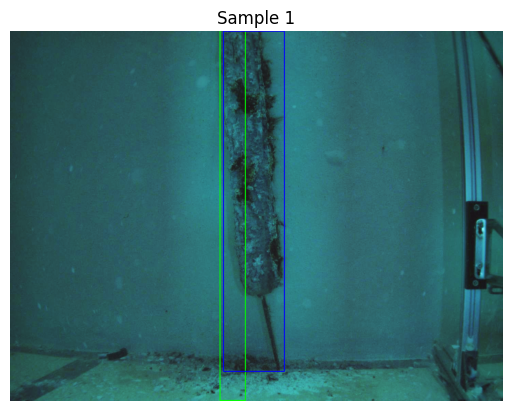

Testing:   0%|          | 1/382 [00:00<01:05,  5.86sample/s, iou=0.277]


Test 2
Predicted Bounding Box: [0.30143407 0.46377745 0.06155136 1.224351  ]
Ground Truth Bounding Box: [0.27813193 0.53556484 0.2029375  0.9288704 ]
IoU: 0.2766137421131134


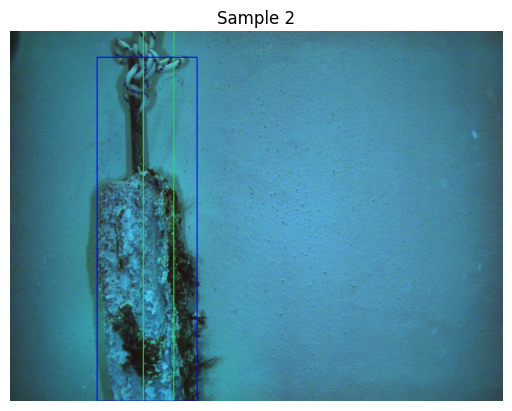

Testing:   1%|          | 2/382 [00:00<01:06,  5.74sample/s, iou=0.379]


Test 3
Predicted Bounding Box: [0.60916936 0.4524893  0.07055774 1.1515425 ]
Ground Truth Bounding Box: [0.65824306 0.5        0.160375   1.        ]
IoU: 0.37888315320014954


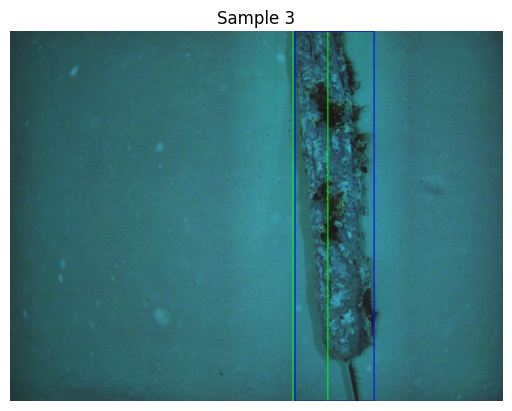

Testing:   1%|          | 3/382 [00:00<01:04,  5.90sample/s, iou=0.232]


Test 4
Predicted Bounding Box: [0.2732269  0.48398486 0.0597004  1.28567   ]
Ground Truth Bounding Box: [0.26188195 0.5        0.23988195 1.        ]
IoU: 0.23235470056533813


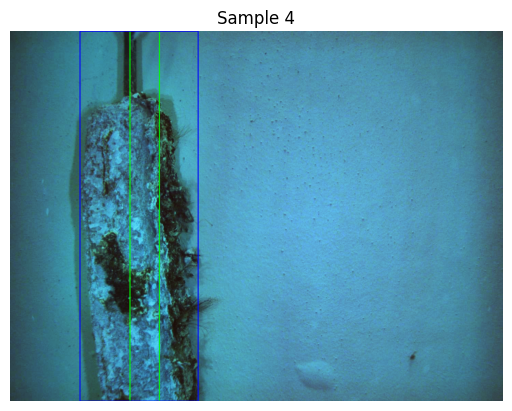

Testing:   1%|          | 4/382 [00:00<01:05,  5.79sample/s, iou=0.238]


Test 5
Predicted Bounding Box: [0.27963713 0.48920956 0.06264713 1.3040662 ]
Ground Truth Bounding Box: [0.25854862 0.5        0.24432638 1.        ]
IoU: 0.2378627210855484


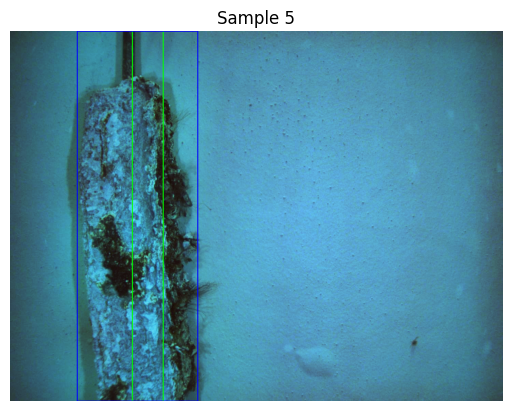

Testing:   1%|▏         | 5/382 [00:00<01:06,  5.66sample/s, iou=0.429]


Test 6
Predicted Bounding Box: [0.53411424 0.42745343 0.0632349  1.0651901 ]
Ground Truth Bounding Box: [0.5659722  0.45062038 0.11342361 0.90123147]
IoU: 0.4288153648376465


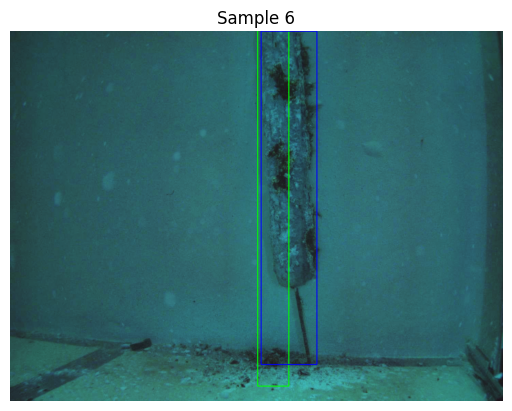

Testing:   2%|▏         | 6/382 [00:01<01:04,  5.83sample/s, iou=0.329]


Test 7
Predicted Bounding Box: [0.30341128 0.5155724  0.09001818 1.3514369 ]
Ground Truth Bounding Box: [0.31424305 0.5        0.24181944 1.        ]
IoU: 0.3291882276535034


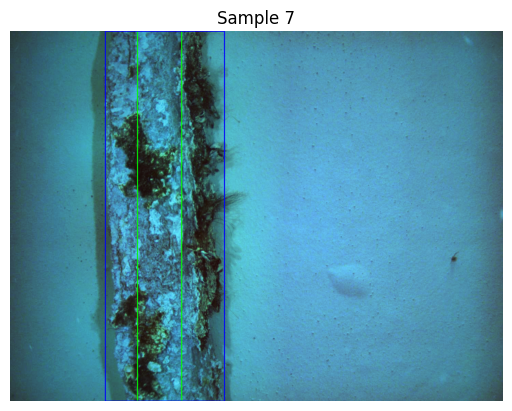

Testing:   2%|▏         | 7/382 [00:01<01:05,  5.73sample/s, iou=0.318]


Test 8
Predicted Bounding Box: [0.3131899  0.5339531  0.09390095 1.4379051 ]
Ground Truth Bounding Box: [0.34131944 0.5        0.2543125  1.        ]
IoU: 0.3178427219390869


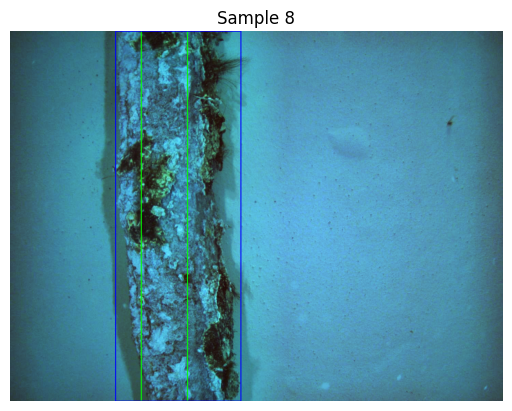

Testing:   2%|▏         | 8/382 [00:01<01:05,  5.69sample/s, iou=0.383]


Test 9
Predicted Bounding Box: [0.61804074 0.46786442 0.06863359 1.1680173 ]
Ground Truth Bounding Box: [0.64640975 0.5        0.16782638 1.        ]
IoU: 0.382662296295166


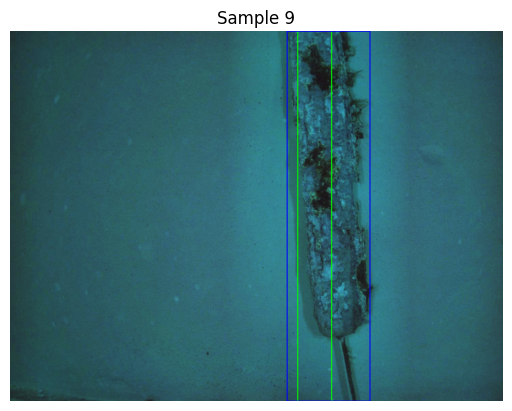

Testing:   2%|▏         | 9/382 [00:01<01:03,  5.85sample/s, iou=0.236]


Test 10
Predicted Bounding Box: [0.35519388 0.4984943  0.05889514 1.4003302 ]
Ground Truth Bounding Box: [0.39525694 0.5        0.22569445 1.        ]
IoU: 0.2362687587738037


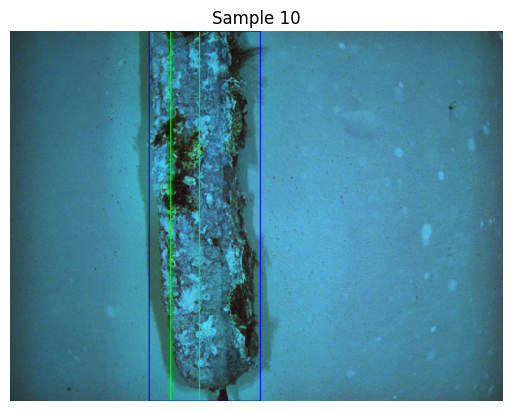

Testing: 100%|██████████| 382/382 [00:10<00:00, 36.30sample/s, iou=0]      

Average IoU: 0.2555


In [24]:
from torch.utils.data import DataLoader

# Test Dataset Paths
test_image_dir = "dataset/pool/test/images"
test_label_dir = "dataset/pool/test/labels"

img_height = 360 # Image size
img_width = 480

# Create Test Dataset and DataLoader
test_dataset = Dataset(image_dir=test_image_dir, label_dir=test_label_dir, img_height=img_height, img_width=img_width)
test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False)

# Load the Trained Model
model = A(img_height, img_width)
model.load_state_dict(torch.load("custom.pth", map_location=device))
model = model.to(device)
model.eval()  # Set the model to evaluation mode

iou_scores = 0.0

# Test the Model with Progress Bar
with torch.no_grad():
    with tqdm(test_loader, unit="sample") as test_bar:
        test_bar.set_description("Testing")
        for idx, (images, targets) in enumerate(test_bar):
            images = images.to(device)
            targets = targets.to(device)

            # Predictions
            predictions = model(images)

            # Calculate Intersection over Union (IoU)
            iou_score = calculate_iou(predictions, targets)

            # Update progress bar with current IoU
            test_bar.set_postfix(iou=iou_score.item())

            # Convert predictions and ground truth to NumPy
            predicted_bbox = predictions[0].cpu().numpy()
            true_bbox = targets[0].cpu().numpy()

            if idx <= 9:  # Stop after showing 10 samples
                print(f"\nTest {idx+1}")
                print(f"Predicted Bounding Box: {predicted_bbox}")
                print(f"Ground Truth Bounding Box: {true_bbox}")
                print(f"IoU: {iou_score.item()}")

                # Load the original image (to get the original size)
                original_img_path = os.path.join(test_image_dir, test_dataset.image_files[idx])
                original_img = cv2.imread(original_img_path)  # Read the original image
                original_height, original_width = original_img.shape[:2]

                # Resize the predicted bounding box to match the original size
                x, y, w, h = predicted_bbox
                x *= original_width
                y *= original_height
                w *= original_width
                h *= original_height

                # Draw predicted bounding box
                x1, y1 = int(x - w / 2), int(y - h / 2)
                x2, y2 = int(x + w / 2), int(y + h / 2)
                original_img = cv2.rectangle(original_img, (x1, y1), (x2, y2), (0, 255, 0), 2)  # Green for predicted

                # Resize the ground truth bounding box to match the original size
                x, y, w, h = true_bbox
                x *= original_width
                y *= original_height
                w *= original_width
                h *= original_height

                # Draw ground truth bounding box
                x1, y1 = int(x - w / 2), int(y - h / 2)
                x2, y2 = int(x + w / 2), int(y + h / 2)
                original_img = cv2.rectangle(original_img, (x1, y1), (x2, y2), (255, 0, 0), 2)  # Blue for ground truth

                # Show image with bounding boxes
                plt.imshow(cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB))
                plt.title(f"Sample {idx + 1}")
                plt.axis("off")
                plt.show()

            iou_scores += iou_score.item()

# Calculate the average IoU score
avg_iou = iou_scores / len(test_loader)
print(f"Average IoU: {avg_iou:.4f}")

# Calculate the total number of parameters
total_params = sum(p.numel() for p in model.parameters())
print(f"Total Parameters in the model: {total_params}")

### Train Custom Model (with Data Augmentation)

In [ ]:
import torch
import torch.nn as nn
from torch import optim
from torch.utils.data import DataLoader

#  Set Paths
train_image_dir = "dataset/pool/train/images"
train_label_dir = "dataset/pool/train/labels"
val_image_dir = "dataset/pool/val/images"
val_label_dir = "dataset/pool/val/labels"

# Model Parameters
img_height = 360 # Image size
img_width = 480
batch_size = 32
num_epochs = 10
learning_rate = 0.001

# Dataset and DataLoader
train_dataset = Dataset(image_dir=train_image_dir, label_dir=train_label_dir, img_height=img_height, img_width=img_width, transform=get_transforms_with_augmentation())
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

val_dataset = Dataset(image_dir=val_image_dir, label_dir=val_label_dir, img_height=img_height, img_width=img_width, transform=get_transforms_with_augmentation())
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)

# Model
model = A1(img_height, img_width).to(device)  # Output for bbox (x, y, w, h)

# Loss and Optimizer
optimizer = optim.Adam(model.parameters(), lr=learning_rate)

best_iou = 0.0

# Training Loop with tqdm
for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    iou_sum = 0.0

    with tqdm(train_loader, unit="batch") as train_bar:
        train_bar.set_description(f"Epoch {epoch + 1}/{num_epochs}")
        for images, targets in train_bar:
            images = images.to(device)
            targets = targets.to(device)

            # Zero the gradients
            optimizer.zero_grad()

            # Forward pass
            bbox_preds = model(images)

            # Compute loss
            loss = loss_function(targets, bbox_preds)
            running_loss += loss.item()

            # Backward pass and update weights
            loss.backward()
            optimizer.step()

            # Calculate IoU
            iou = calculate_iou(bbox_preds, targets)
            iou_mean = iou.mean().item()
            iou_sum += iou_mean

            # Update progress bar
            train_bar.set_postfix(loss=loss.item(), iou=iou_mean)

    torch.cuda.empty_cache()

    avg_train_loss = running_loss / len(train_loader)
    avg_train_iou = iou_sum / len(train_loader)
    print(f"Epoch {epoch + 1}/{num_epochs}, Train Loss: {avg_train_loss:.4f}, IoU: {avg_train_iou:.4f}")

    #Best Epoch
    if avg_train_iou > best_iou:
        print("Best Epoch")
        best_iou = avg_train_iou
        best_epoch = epoch
        loss = avg_train_loss
        torch.save(model.state_dict(), "custom.pth")

    # Validation Loop with tqdm
    model.eval()
    val_loss = 0.0
    val_iou_sum = 0.0

    with tqdm(val_loader, unit="batch") as val_bar:
        val_bar.set_description(f"Validation {epoch + 1}/{num_epochs}")
        with torch.no_grad():
            for images, targets in val_bar:
                images = images.to(device)
                targets = targets.to(device)

                bbox_preds = model(images)

                # Compute losses
                loss = loss_function(targets, bbox_preds)
                val_loss += loss.item()

                # Calculate IoU
                val_iou = calculate_iou(bbox_preds, targets)
                val_iou_mean = val_iou.mean().item()
                val_iou_sum += val_iou_mean

                # Update progress bar
                val_bar.set_postfix(loss=loss.item(), iou=val_iou_mean)

    torch.cuda.empty_cache()

    avg_val_loss = val_loss / len(val_loader)
    avg_val_iou = val_iou_sum / len(val_loader)
    print(f"Validation {epoch + 1}/{num_epochs}, Val Loss: {avg_val_loss:.4f}, IoU: {avg_val_iou:.4f}")

### RESNET EXAMPLE

In [14]:
from torchvision.models import resnet50,ResNet50_Weights
from torch.utils.data import DataLoader
from torch import optim

#  Set Paths
train_image_dir = "dataset/combined/train/images"          # Replace with your images directory
train_label_dir = "dataset/combined/train/labels"  # Replace with your annotations directory
val_image_dir = "dataset/combined/val/images"
val_label_dir = "dataset/combined/val/labels"
img_size = 224  # ResNet requires 224x224 images

# Train Dataset and DataLoader
train_dataset = Dataset(image_dir=train_image_dir, annotation_dir=train_label_dir, img_size=img_size)
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)

# Validation Dataset and DataLoader
val_dataset = Dataset(image_dir=val_image_dir, annotation_dir=val_label_dir, img_size=img_size)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)

# Model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = resnet50(weights=ResNet50_Weights.IMAGENET1K_V1)
model.fc = nn.Linear(model.fc.in_features, 4)  # Output for bbox (x, y, w, h)
model = model.to(device)

# Loss and Optimizer
criterion = nn.MSELoss()  # Mean Squared Error for bounding box regression
optimizer = optim.Adam(model.parameters(), lr=0.001)

# Training Loop
num_epochs = 5
for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0

    for images, targets in train_loader:
        images, targets = images.to(device), targets.to(device)
        
        # Zero the gradients
        optimizer.zero_grad()
        
        # Forward pass
        outputs = model(images)
        
        # Compute loss
        loss = criterion(outputs, targets)
        
        # Backward pass and update weights
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item()

    print(f"Epoch {epoch + 1}/{num_epochs}, Train Loss: {running_loss / len(train_loader):.4f}")

    # Validation Loop
    model.eval()
    val_loss = 0.0
    with torch.no_grad():
        for images, targets in val_loader:
            images, targets = images.to(device), targets.to(device)
            outputs = model(images)
            loss = criterion(outputs, targets)
            val_loss += loss.item()

    print(f"Epoch {epoch + 1}/{num_epochs}, Val Loss: {val_loss / len(val_loader):.4f}")

# Save the Model
torch.save(model.state_dict(), "resnet50_bounding_box.pth")
print("Model saved as resnet50_bounding_box.pth")

NameError: name 'Dataset' is not defined

Sample 1
Predicted Bounding Box: [110.38807    109.39163     47.2813     189.31313      0.98076016]
Ground Truth: [171.21378  191.18814   18.749111  65.6237     1.      ]


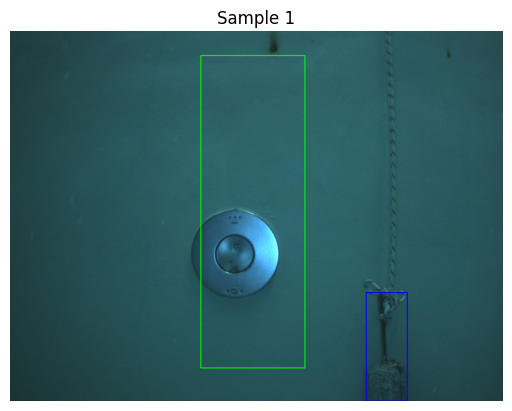

Sample 2
Predicted Bounding Box: [ 83.35467  113.005165  54.396767 208.15889    1.049913]
Ground Truth: [ 70.01711 112.       58.39711 224.        1.     ]


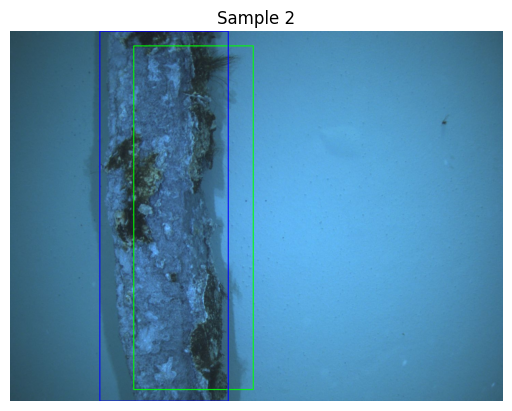

Sample 3
Predicted Bounding Box: [131.6919    116.61949    47.3795    214.737       1.0294199]
Ground Truth: [130.58578  112.        35.802666 224.         1.      ]


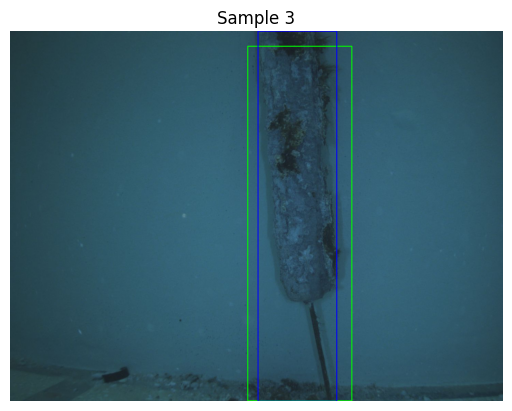

Sample 4
Predicted Bounding Box: [114.225555   110.241135    45.838074   189.1297       0.94893193]
Ground Truth: [203.80888 135.89333  40.38222 176.21333   1.     ]


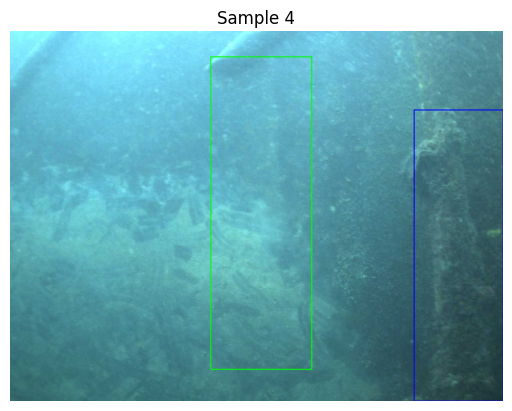

Sample 5
Predicted Bounding Box: [138.56976   114.6056     46.76873   206.56473     1.0392118]
Ground Truth: [159.5471  112.       44.56978 224.        1.     ]


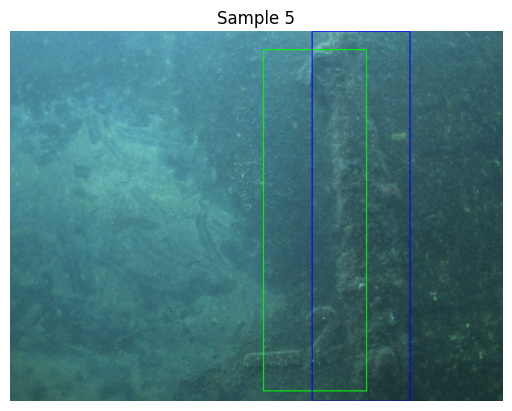

Sample 6
Predicted Bounding Box: [124.080414  111.61497    47.621998  209.53133     1.0328056]
Ground Truth: [126.10578  90.47111  36.79822 180.94221   1.     ]


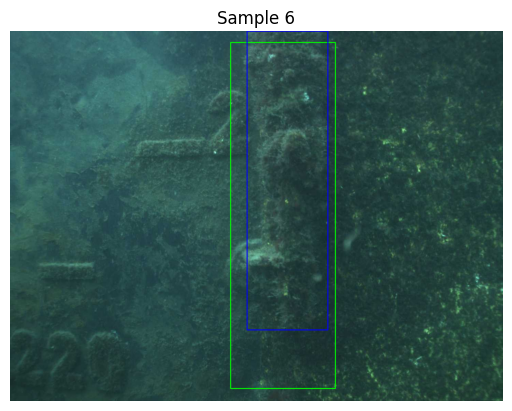

Sample 7
Predicted Bounding Box: [ 83.02771   111.11477    47.424717  195.18039     1.0172695]
Ground Truth: [ 27.740223  97.522964  42.913113 195.04593    1.      ]


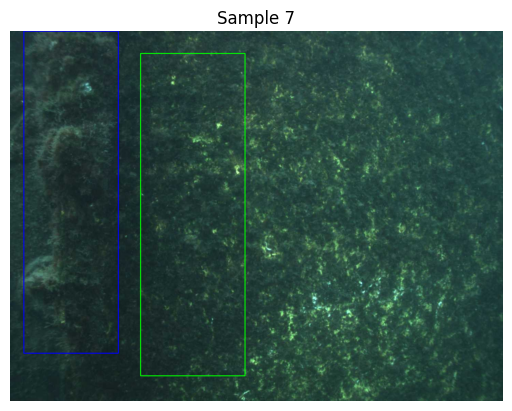

Sample 8
Predicted Bounding Box: [110.61715    110.74735     45.159637   187.9489       0.97826487]
Ground Truth: [197.58667  112.        52.826668 224.         1.      ]


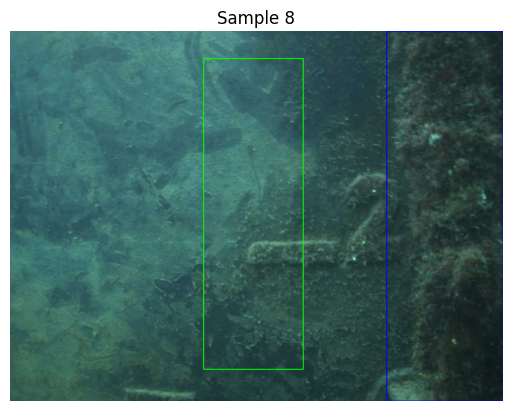

Sample 9
Predicted Bounding Box: [113.46591   113.75946    52.062626  215.33878     1.0359763]
Ground Truth: [115.83911 112.       74.75378 224.        1.     ]


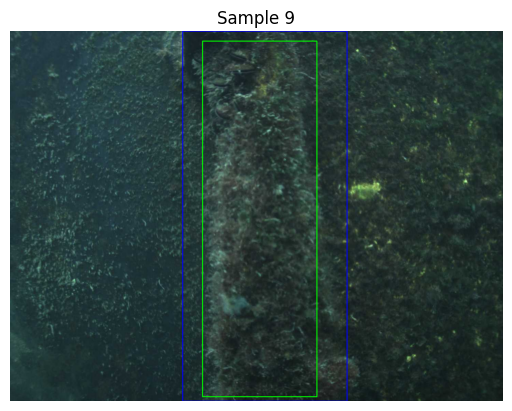

Sample 10
Predicted Bounding Box: [127.27327   117.350044   47.071037  200.80663     1.0292802]
Ground Truth: [123.24355 141.49333  60.93889 165.01334   1.     ]


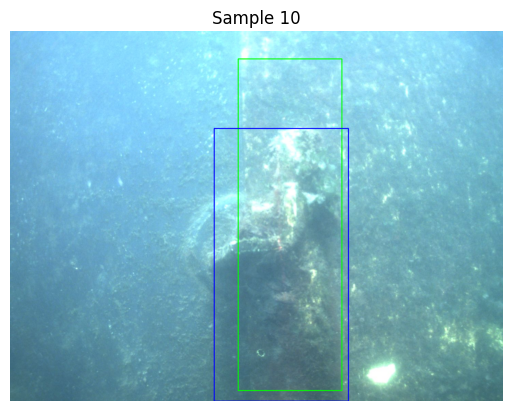

Sample 11
Predicted Bounding Box: [118.36021   112.15919    52.158596  214.19698     1.0202951]
Ground Truth: [120.25533  112.        77.365555 224.         1.      ]


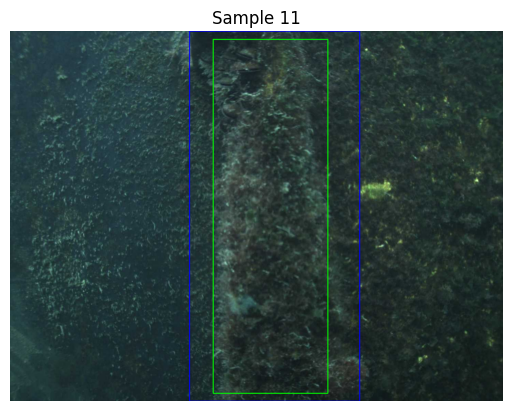

In [ ]:
from torchvision.models import resnet50,ResNet50_Weights
from torch.utils.data import DataLoader
from torch import optim

# Test Dataset Paths
test_image_dir = "dataset/combined/test/images"
test_label_dir = "dataset/combined/test/labels"
img_size = 224

# Create Test Dataset and DataLoader
test_dataset = Dataset(image_dir=test_image_dir, label_dir=test_label_dir, img_size=img_size)
test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False)

# Load the Trained Model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = resnet50(weights=None)  # Initialize model
model.fc = torch.nn.Linear(model.fc.in_features, 4)  # Adjust output layer
model.load_state_dict(torch.load("resnet50_bounding_box.pth", weights_only=True))
model = model.to(device)


# Test the Model
with torch.no_grad():
    for idx, (images, targets) in enumerate(test_loader):
        images = images.to(device)
        targets = targets.to(device)

        # Predictions
        outputs = model(images)

        # Get predicted bounding boxes
        predicted_bbox = outputs[0].cpu().numpy()  # Convert to NumPy
        true_bbox = targets[0].cpu().numpy()

        # Print predictions and ground truth
        print(f"Sample {idx + 1}")
        print(f"Predicted Bounding Box: {predicted_bbox}")
        print(f"Ground Truth: {true_bbox}")

        # Load the original image (to get the original size)
        original_img_path = os.path.join(test_image_dir, test_dataset.image_files[idx])
        original_img = cv2.imread(original_img_path)  # Read the original image
        original_height, original_width = original_img.shape[:2]

        # Resize the predicted bounding box to match the original size
        x, y, w, h = predicted_bbox[:4]
        x *= original_width / img_size
        y *= original_height / img_size
        w *= original_width / img_size
        h *= original_height / img_size

        # Draw predicted bounding box
        x1, y1 = int(x - w / 2), int(y - h / 2)
        x2, y2 = int(x + w / 2), int(y + h / 2)
        original_img = cv2.rectangle(original_img, (x1, y1), (x2, y2), (0, 255, 0), 2)  # Green for predicted

        # Resize the ground truth bounding box to match the original size
        x, y, w, h = true_bbox[:4]
        x *= original_width / img_size
        y *= original_height / img_size
        w *= original_width / img_size
        h *= original_height / img_size

        # Draw ground truth bounding box
        x1, y1 = int(x - w / 2), int(y - h / 2)
        x2, y2 = int(x + w / 2), int(y + h / 2)
        original_img = cv2.rectangle(original_img, (x1, y1), (x2, y2), (255, 0, 0), 2)  # Blue for ground truth

        # Show image with bounding boxes
        plt.imshow(cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB))
        plt.title(f"Sample {idx + 1}")
        plt.axis("off")
        plt.show()

        if idx == 10:
            break

### EFFICIENT EXAMPLE

In [13]:
from torchvision.models import efficientnet_b0, EfficientNet_B0_Weights
from torch.utils.data import DataLoader
from torch import optim, nn
import torch

# Test Dataset Paths
test_image_dir = "dataset/combined/test/images"
test_label_dir = "dataset/combined/test/labels"
img_size = 224

# Create Test Dataset and DataLoader
test_dataset = Dataset(image_dir=test_image_dir, label_dir=test_label_dir, img_size=img_size)
test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False)

# Load the Trained Model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = efficientnet_b0(weights=None)  # Initialize model
model.fc = nn.Linear(model.fc.in_features, 4)  # Adjust output layer
model = model.to(device)

# Loss and Optimizer
criterion = nn.MSELoss()  # Mean Squared Error for bounding box regression
optimizer = optim.Adam(model.parameters(), lr=0.001)

# Training Loop
num_epochs = 5
for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0

    for images, targets in train_loader:
        images, targets = images.to(device), targets.to(device)
        
        # Zero the gradients
        optimizer.zero_grad()
        
        # Forward pass
        outputs = model(images)
        
        # Compute loss
        loss = criterion(outputs, targets)
        
        # Backward pass and update weights
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item()

    print(f"Epoch {epoch + 1}/{num_epochs}, Train Loss: {running_loss / len(train_loader):.4f}")

    # Validation Loop
    model.eval()
    val_loss = 0.0
    with torch.no_grad():
        for images, targets in val_loader:
            images, targets = images.to(device), targets.to(device)
            outputs = model(images)
            loss = criterion(outputs, targets)
            val_loss += loss.item()

    print(f"Epoch {epoch + 1}/{num_epochs}, Val Loss: {val_loss / len(val_loader):.4f}")

# Save the Model
torch.save(model.state_dict(), "efficientnet_b0_bounding_box.pth")
print("Model saved as efficientnet_b0_bounding_box.pth")


NameError: name 'Dataset' is not defined

In [ ]:
from torchvision.models import efficientnet_b0, EfficientNet_B0_Weights
from torch.utils.data import DataLoader
from torch import optim

# Test Dataset Paths
test_image_dir = "dataset/combined/test/images"
test_label_dir = "dataset/combined/test/labels"
img_size = 224

# Create Test Dataset and DataLoader
test_dataset = Dataset(image_dir=test_image_dir, label_dir=test_label_dir, img_size=img_size)
test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False)

# Load the Trained Model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = efficientnet_b0(weights=None)  # Initialize model
model.fc = torch.nn.Linear(model.fc.in_features, 4)  # Adjust output layer
model.load_state_dict(torch.load("efficientnet_b0_bounding_box.pth", weights_only=True))
model = model.to(device)


# Test the Model
with torch.no_grad():
    for idx, (images, targets) in enumerate(test_loader):
        images = images.to(device)
        targets = targets.to(device)

        # Predictions
        outputs = model(images)

        # Get predicted bounding boxes
        predicted_bbox = outputs[0].cpu().numpy()  # Convert to NumPy
        true_bbox = targets[0].cpu().numpy()

        # Print predictions and ground truth
        print(f"Sample {idx + 1}")
        print(f"Predicted Bounding Box: {predicted_bbox}")
        print(f"Ground Truth: {true_bbox}")

        # Load the original image (to get the original size)
        original_img_path = os.path.join(test_image_dir, test_dataset.image_files[idx])
        original_img = cv2.imread(original_img_path)  # Read the original image
        original_height, original_width = original_img.shape[:2]

        # Resize the predicted bounding box to match the original size
        x, y, w, h = predicted_bbox[:4]
        x *= original_width / img_size
        y *= original_height / img_size
        w *= original_width / img_size
        h *= original_height / img_size

        # Draw predicted bounding box
        x1, y1 = int(x - w / 2), int(y - h / 2)
        x2, y2 = int(x + w / 2), int(y + h / 2)
        original_img = cv2.rectangle(original_img, (x1, y1), (x2, y2), (0, 255, 0), 2)  # Green for predicted

        # Resize the ground truth bounding box to match the original size
        x, y, w, h = true_bbox[:4]
        x *= original_width / img_size
        y *= original_height / img_size
        w *= original_width / img_size
        h *= original_height / img_size

        # Draw ground truth bounding box
        x1, y1 = int(x - w / 2), int(y - h / 2)
        x2, y2 = int(x + w / 2), int(y + h / 2)
        original_img = cv2.rectangle(original_img, (x1, y1), (x2, y2), (255, 0, 0), 2)  # Blue for ground truth

        # Show image with bounding boxes
        plt.imshow(cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB))
        plt.title(f"Sample {idx + 1}")
        plt.axis("off")
        plt.show()

        if idx == 10:
            break